# plants Disease Classification

### Importing  the libraries

In [211]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
from IPython.display import HTML
import pandas as pd 


In [209]:
### Some of Constants i have used

BATCH_SIZE = 32
IMAGE_SIZE = 256
CHANNELS=3


### Import data into tensorflow dataset object

### We will use image_dataset_from_directory api to load all images in tensorflow dataset: 
https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image_dataset_from_directory

## why I use Tensorflow  data set ?
### Brifly  tensorflow datasets is very useful because it can load data into batches and train the model in this batches 
### and it will high performance

In [212]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "PlantVillage",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 2152 files belonging to 3 classes.


## labels names

In [214]:
class_names = dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [9]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

(32, 256, 256, 3)
[1 1 1 0 0 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 0 1 0 0 1 0 0 1 1 2 0 0]


#### As you can see above, Tensor flow data set return with tow elemnts :First element is a batch of 32  images. Second element is a batch of 32 elements of class labels 

### Visualize some of the images from our dataset using subplot function

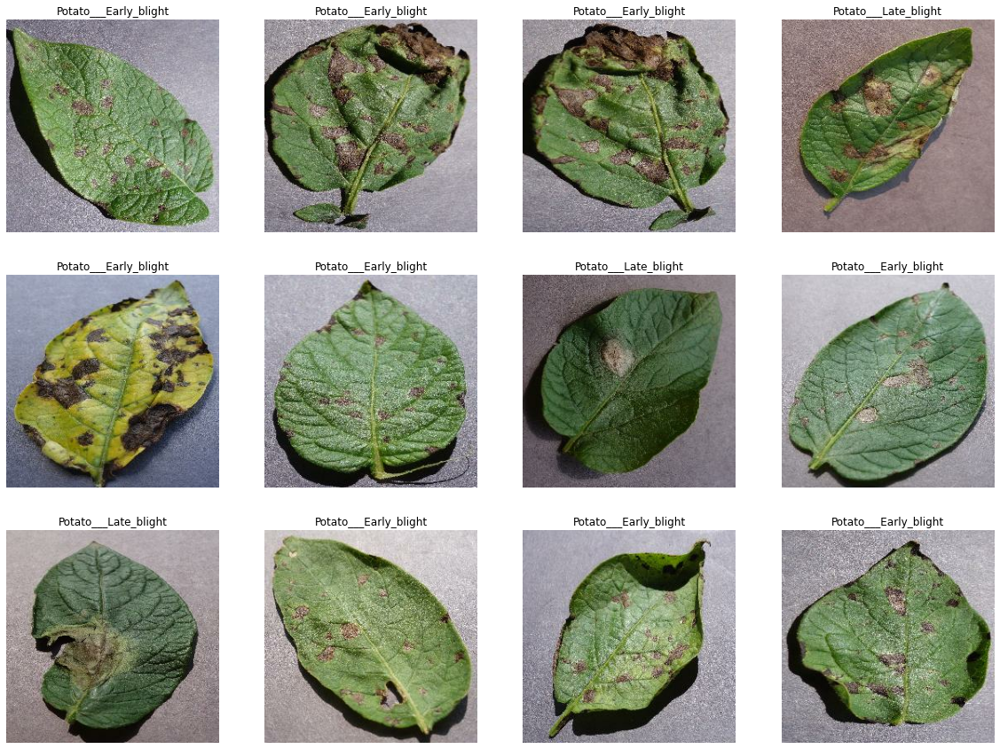

In [215]:
plt.figure(figsize=(20, 15))
for image_batch, labels_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

###  Creating a function to Split Dataset

 the Dataset will be bifurcated into 3 subsets, namely:
1. Training: Dataset to be used while training
2. Validation: Dataset to be tested against while training
3. Test: Dataset to be tested against after we trained a model

In [116]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [19]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

In [20]:
len(train_ds)

54

In [21]:
len(val_ds)

6

In [22]:
len(test_ds)

8

### Cache, Shuffle, and Prefetch the Dataset

In [23]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

### By apllaying prefetech and cach It will give a high performance briefly it will save alot of timeٍ lost in some operations like  opening ,reading,maping  datasets

## Building the Model

###  Resizing and Normalization
Before we feed our images to network, we should be resizing it to the desired size. 
Moreover, to improve model performance, we should normalize the image pixel value (keeping them in range 0 and 1 by dividing by 256).
This should happen while training as well as inference. Hence we can add that as a layer in our Sequential Model.

and it help us when we using the model for predictions. At that time somone can supply an image that is not (256,256) and this layer will resize it

In [24]:
resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
  layers.experimental.preprocessing.Rescaling(1./255),
])

### Data Augmentation
Data Augmentation is needed when we have less data, this boosts the accuracy of our model by augmenting the data.

In [25]:
data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.2),
])

#### Applying Data Augmentation to Train Dataset

In [26]:
train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)



**Watch below video if you are not familiar with data augmentation**

### Model Architecture


#### We are going to use convolutional neural network (CNN) here. CNN is popular for image classification tasks

In [28]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 3

model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

model.build(input_shape=input_shape)

In [29]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (32, 256, 256, 3)         0         
_________________________________________________________________
conv2d (Conv2D)              (32, 254, 254, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (32, 127, 127, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (32, 125, 125, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (32, 62, 62, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (32, 60, 60, 64)          36928     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (32, 30, 30, 64)         

### Compiling the Model
We use `adam` Optimizer, `SparseCategoricalCrossentropy` for losses, `accuracy` as a metric

In [30]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [31]:
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
)

Epoch 1/50
54/54 [==============================] - 316s 4s/step - loss: 0.9196 - accuracy: 0.4954 - val_loss: 0.9036 - val_accuracy: 0.5000
Epoch 2/50
54/54 [==============================] - 116s 2s/step - loss: 0.7332 - accuracy: 0.6736 - val_loss: 0.5549 - val_accuracy: 0.7656
Epoch 3/50
54/54 [==============================] - 120s 2s/step - loss: 0.4605 - accuracy: 0.8050 - val_loss: 0.3699 - val_accuracy: 0.8594
Epoch 4/50
54/54 [==============================] - 120s 2s/step - loss: 0.3028 - accuracy: 0.8843 - val_loss: 0.3327 - val_accuracy: 0.8594
Epoch 5/50
54/54 [==============================] - 120s 2s/step - loss: 0.3143 - accuracy: 0.8854 - val_loss: 0.3489 - val_accuracy: 0.8750
Epoch 6/50
54/54 [==============================] - 119s 2s/step - loss: 0.2338 - accuracy: 0.8999 - val_loss: 0.1771 - val_accuracy: 0.9271
Epoch 7/50
54/54 [==============================] - 121s 2s/step - loss: 0.2184 - accuracy: 0.9126 - val_loss: 0.1850 - val_accuracy: 0.9427
Epoch 8/50
54

## model evaluation

In [32]:
scores = model.evaluate(test_ds)

8/8 [==============================] - 68s 518ms/step - loss: 0.0440 - accuracy: 0.9883


In [33]:
scores

[0.04401078447699547, 0.98828125]

Scores is just a list containing loss and accuracy value

### Plotting the Accuracy and Loss Curves

In [37]:
loses=pd.DataFrame(history.history)
loses.head()

,loss,accuracy,val_loss,val_accuracy
0,0.919606,0.495370,0.903554,0.500000
1,0.733241,0.673611,0.554864,0.765625
2,0.460461,0.804977,0.369893,0.859375
3,0.302815,0.884259,0.332667,0.859375
4,0.314270,0.885417,0.348872,0.875000


<AxesSubplot:>

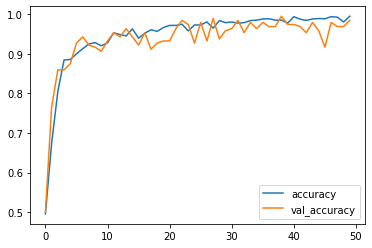

In [38]:
loses[['accuracy','val_accuracy']].plot()

<AxesSubplot:>

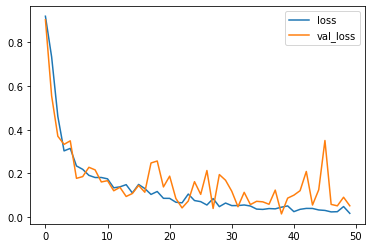

In [39]:
loses[['loss','val_loss']].plot()

### Run prediction on a sample image

first image to predict
actual label: Potato___Early_blight
predicted label: Potato___Early_blight


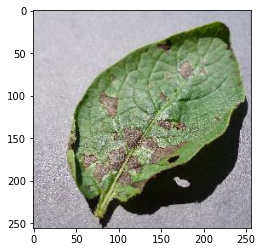

In [49]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

### Write a function for inference

In [53]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

**Now run inference on few sample images**

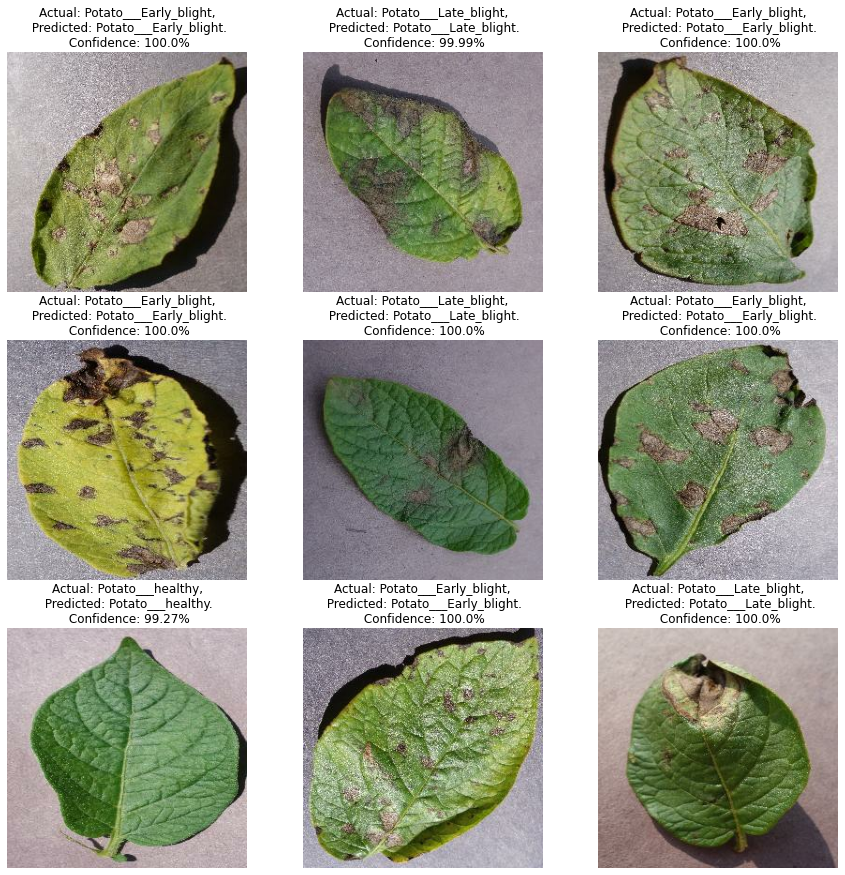

In [51]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

### Saving the Model For using it again in model deployment


In [54]:
import os
model_version=max([int(i) for i in os.listdir("../models") + [0]])+1
model.save(f"../models/{model_version}")

INFO:tensorflow:Assets written to: ../models/1\assets


In [55]:
model.save("../potatoes.h5")

# we will applaying the last steps for tomatoes datasets

### tomatoes datasets

In [5]:
dataset_2 = tf.keras.preprocessing.image_dataset_from_directory(
    "tomato",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 11105 files belonging to 10 classes.


In [6]:
class_names_2 = dataset_2.class_names
class_names_2

['Tomato_Bacterial_spot',
 'Tomato_Early_blight',
 'Tomato_Late_blight',
 'Tomato_Leaf_Mold',
 'Tomato_Septoria_leaf_spot',
 'Tomato_Spider_mites_Two_spotted_spider_mite',
 'Tomato__Target_Spot',
 'Tomato__Tomato_YellowLeaf__Curl_Virus',
 'Tomato__Tomato_mosaic_virus',
 'Tomato_healthy']

In [7]:
for image_batch_2, labels_batch_2 in dataset_2.take(1):
    print(image_batch_2.shape)
    print(labels_batch_2.numpy())

(32, 256, 256, 3)
[0 6 5 5 0 0 9 0 0 9 3 3 3 6 1 1 2 8 7 0 0 3 3 5 2 4 1 0 0 1 5 2]


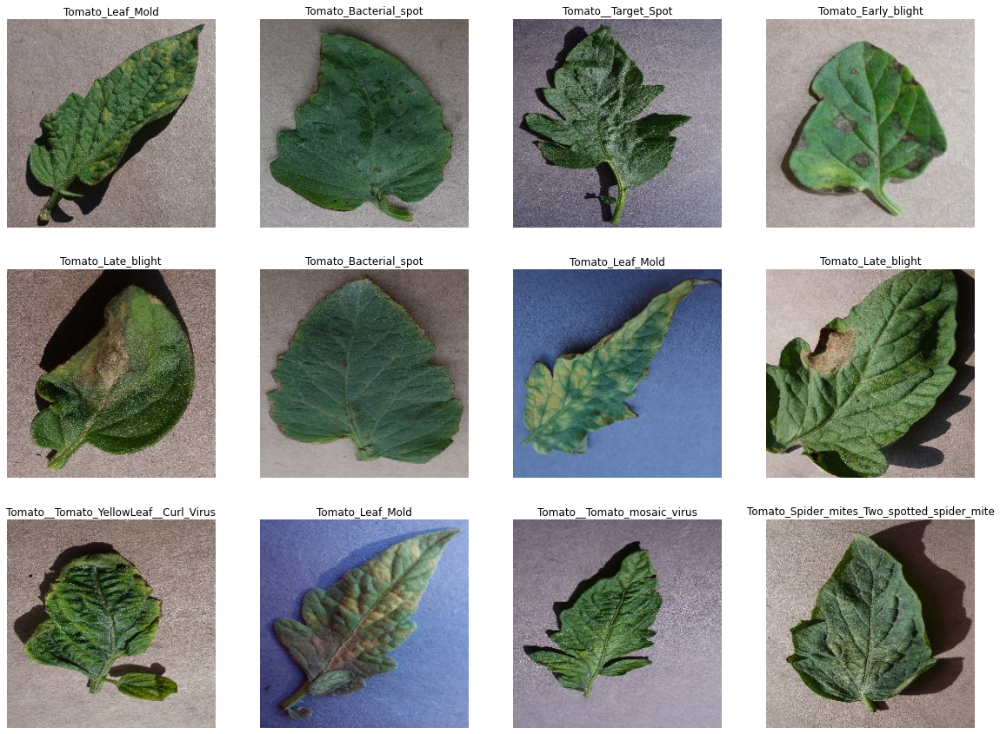

In [9]:
plt.figure(figsize=(20, 15))
for image_batch_2, labels_batch_2 in dataset_2.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch_2[i].numpy().astype("uint8"))
        plt.title(class_names_2[labels_batch_2[i]])
        plt.axis("off")


In [17]:
train_ds_2, val_ds_2, test_ds_2 = get_dataset_partitions_tf(dataset_2)

In [18]:
len(train_ds_2)

278

In [19]:
len(val_ds_2)

34

In [20]:
len(test_ds_2)

36

In [21]:
train_ds_2 = train_ds_2.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds_2 = val_ds_2.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds_2 = test_ds_2.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [22]:
resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
  layers.experimental.preprocessing.Rescaling(1./255),
])

In [23]:
data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.2),
])

In [46]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 10

tomato_model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(32,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

tomato_model.build(input_shape=input_shape)

In [47]:
tomato_model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_19 (Conv2D)           (32, 254, 254, 32)        896       
_________________________________________________________________
max_pooling2d_19 (MaxPooling (32, 127, 127, 32)        0         
_________________________________________________________________
conv2d_20 (Conv2D)           (32, 125, 125, 32)        9248      
_________________________________________________________________
max_pooling2d_20 (MaxPooling (32, 62, 62, 32)          0         
_________________________________________________________________
conv2d_21 (Conv2D)           (32, 60, 60, 64)          18496     
_________________________________________________________________
max_pooling2d_21 (MaxPooling (32, 30, 30, 64)         

In [48]:
tomato_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [49]:
history_2 = tomato_model.fit(
    train_ds_2,
    batch_size=BATCH_SIZE,
    validation_data=val_ds_2,
    verbose=1,
    epochs=10,
)

Epoch 1/10
278/278 [==============================] - 811s 3s/step - loss: 1.4831 - accuracy: 0.4811 - val_loss: 0.9052 - val_accuracy: 0.6866
Epoch 2/10
278/278 [==============================] - 836s 3s/step - loss: 0.6550 - accuracy: 0.7772 - val_loss: 0.5562 - val_accuracy: 0.8263
Epoch 3/10
278/278 [==============================] - 895s 3s/step - loss: 0.4834 - accuracy: 0.8332 - val_loss: 0.4375 - val_accuracy: 0.8732
Epoch 4/10
278/278 [==============================] - 901s 3s/step - loss: 0.3577 - accuracy: 0.8784 - val_loss: 0.3628 - val_accuracy: 0.8915
Epoch 5/10
278/278 [==============================] - 786s 3s/step - loss: 0.3066 - accuracy: 0.8960 - val_loss: 0.3983 - val_accuracy: 0.8842
Epoch 6/10
278/278 [==============================] - 1000s 4s/step - loss: 0.2339 - accuracy: 0.9223 - val_loss: 0.2857 - val_accuracy: 0.9219
Epoch 7/10
278/278 [==============================] - 938s 3s/step - loss: 0.1923 - accuracy: 0.9349 - val_loss: 0.2779 - val_accuracy: 0.948

In [50]:
scores_2 = tomato_model.evaluate(test_ds_2)

36/36 [==============================] - 914s 1s/step - loss: 0.1385 - accuracy: 0.9609


first image to predict
actual label: Tomato_Septoria_leaf_spot
predicted label: Tomato_Septoria_leaf_spot


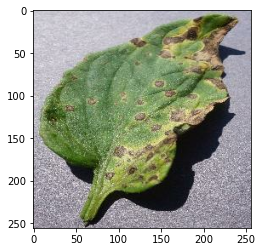

In [52]:
import numpy as np
for images_batch_2, labels_batch_2 in test_ds_2.take(1):
    
    first_image_2 = images_batch_2[0].numpy().astype('uint8')
    first_label_2 = labels_batch_2[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image_2)
    print("actual label:",class_names_2[first_label_2])
    
    batch_prediction_2 = tomato_model.predict(images_batch_2)
    print("predicted label:",class_names_2[np.argmax(batch_prediction_2[0])])

In [55]:
def predict_tom(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names_2[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

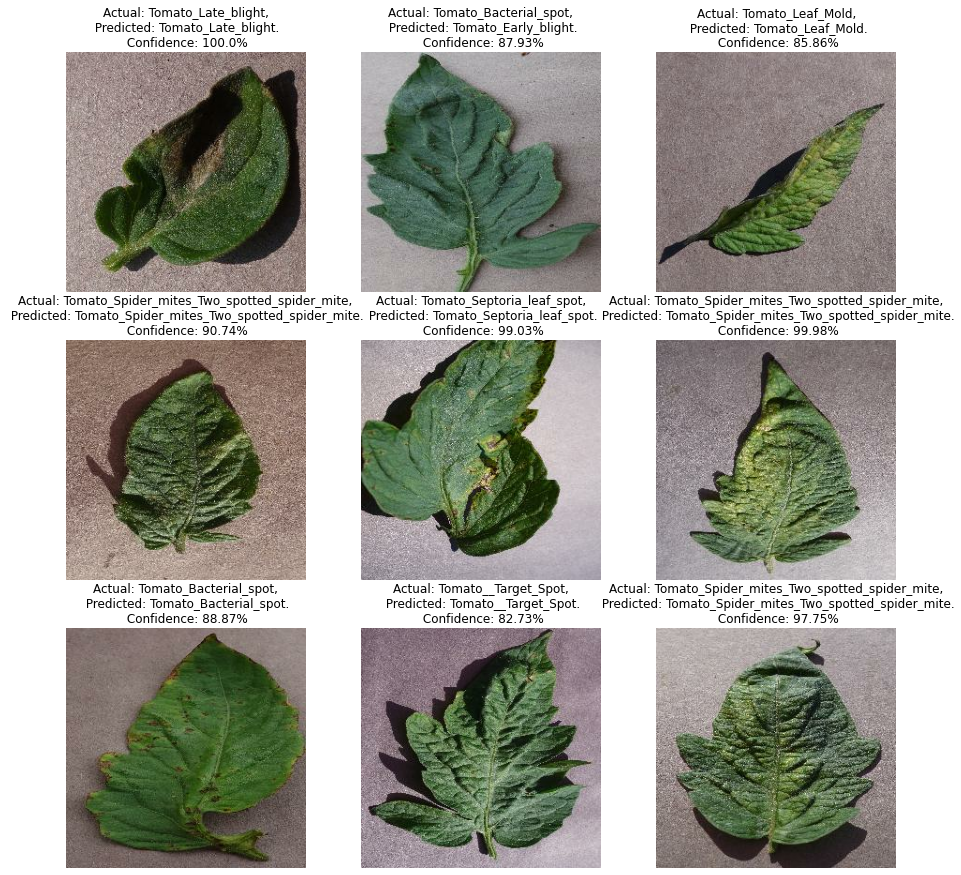

In [56]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds_2.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict_tom(tomato_model, images[i].numpy())
        actual_class = class_names_2[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

In [58]:
import os
model_version=max([int(i) for i in os.listdir("../tomato _model/") + [0]])+1
tomato_model.save(f"../tomato _model/{model_version}")

INFO:tensorflow:Assets written to: ../tomato _model/1\assets


INFO:tensorflow:Assets written to: ../tomato _model/1\assets


In [60]:
tomato_model.save("../tomatoes.h5")

## PEPPER BELL DATASETS

In [110]:
dataset_3 = tf.keras.preprocessing.image_dataset_from_directory(
    "pepper",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 2475 files belonging to 2 classes.


In [111]:
class_names_3 = dataset_3.class_names
class_names_3

['Pepper__bell___Bacterial_spot', 'Pepper__bell___healthy']

In [112]:
for image_batch_3, labels_batch_3 in dataset_3.take(1):
    print(image_batch_3.shape)
    print(labels_batch_3.numpy())

(32, 256, 256, 3)
[1 1 0 1 0 0 0 1 0 1 1 0 0 1 0 1 1 1 1 1 1 1 0 1 1 1 0 1 1 0 1 1]


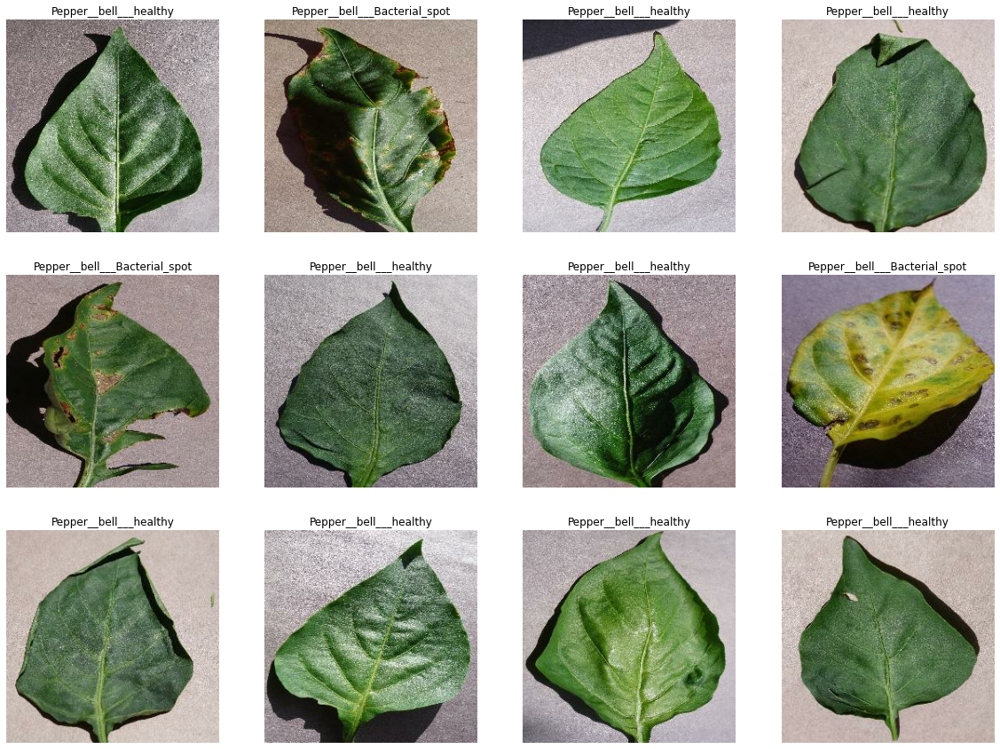

In [115]:
plt.figure(figsize=(20, 15))
for image_batch_3, labels_batch_3 in dataset_3.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch_3[i].numpy().astype("uint8"))
        plt.title(class_names_3[labels_batch_3[i]])
        plt.axis("off")


In [114]:
len(dataset_2)

348

In [160]:
train_ds_3, val_ds_3, test_ds_3 = get_dataset_partitions_tf(dataset_3)

In [161]:
len(train_ds_3)

62

In [162]:
len(val_ds_3)

7

In [163]:
len(test_ds_3)

9

In [183]:
train_ds_3 = train_ds_3.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds_3 = val_ds_3.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds_3 = test_ds_3.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [184]:
resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
  layers.experimental.preprocessing.Rescaling(1./255),
])

In [185]:
data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.2),
])

In [186]:
train_ds_3 = train_ds_3.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)



In [187]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 2

pepp_model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

pepp_model.build(input_shape=input_shape)

In [188]:
pepp_model.summary()

Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_26 (Sequential)   (32, 256, 256, 3)         0         
_________________________________________________________________
conv2d_92 (Conv2D)           (32, 254, 254, 32)        896       
_________________________________________________________________
max_pooling2d_92 (MaxPooling (32, 127, 127, 32)        0         
_________________________________________________________________
conv2d_93 (Conv2D)           (32, 125, 125, 64)        18496     
_________________________________________________________________
max_pooling2d_93 (MaxPooling (32, 62, 62, 64)          0         
_________________________________________________________________
conv2d_94 (Conv2D)           (32, 60, 60, 64)          36928     
_________________________________________________________________
max_pooling2d_94 (MaxPooling (32, 30, 30, 64)        

In [189]:
pepp_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [190]:
from tensorflow.keras.callbacks import EarlyStopping
early_stop = EarlyStopping(monitor='val_loss',patience=2)

In [191]:
history = pepp_model.fit(
    train_ds_3,
    batch_size=BATCH_SIZE,
    validation_data=val_ds_3,
    verbose=1,
    epochs=30,
    callbacks=early_stop
)

Epoch 1/30
62/62 [==============================] - 450s 6s/step - loss: 0.6426 - accuracy: 0.6368 - val_loss: 0.3572 - val_accuracy: 0.8616
Epoch 2/30
62/62 [==============================] - 146s 2s/step - loss: 0.3543 - accuracy: 0.8879 - val_loss: 0.2552 - val_accuracy: 0.8929
Epoch 3/30
62/62 [==============================] - 141s 2s/step - loss: 0.1535 - accuracy: 0.9557 - val_loss: 0.1293 - val_accuracy: 0.9420
Epoch 4/30
62/62 [==============================] - 141s 2s/step - loss: 0.1423 - accuracy: 0.9633 - val_loss: 0.0550 - val_accuracy: 0.9777
Epoch 5/30
62/62 [==============================] - 133s 2s/step - loss: 0.0559 - accuracy: 0.9908 - val_loss: 0.0077 - val_accuracy: 1.0000
Epoch 6/30
62/62 [==============================] - 139s 2s/step - loss: 0.0478 - accuracy: 0.9847 - val_loss: 0.0031 - val_accuracy: 1.0000
Epoch 7/30
62/62 [==============================] - 132s 2s/step - loss: 0.0407 - accuracy: 0.9903 - val_loss: 0.0040 - val_accuracy: 1.0000
Epoch 8/30
62

In [193]:
scores_3 = pepp_model.evaluate(test_ds_3)

9/9 [==============================] - 5s 521ms/step - loss: 0.0075 - accuracy: 1.0000


In [194]:
scores_3

[0.007466522976756096, 1.0]

In [195]:
loses_3=pd.DataFrame(history.history)
loses_3.head()

,loss,accuracy,val_loss,val_accuracy
0,0.642581,0.636780,0.357239,0.861607
1,0.354313,0.887927,0.255158,0.892857
2,0.153484,0.955680,0.129279,0.941964
3,0.142323,0.963321,0.055012,0.977679
4,0.055890,0.990830,0.007683,1.000000


<AxesSubplot:>

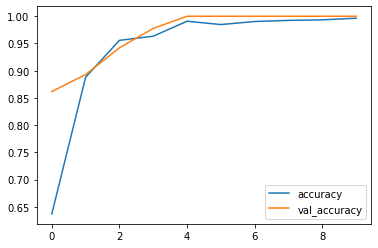

In [196]:
loses_3[['accuracy','val_accuracy']].plot()

<AxesSubplot:>

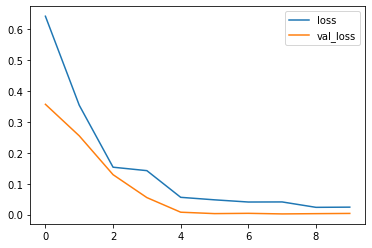

In [197]:
loses_3[['loss','val_loss']].plot()

first image to predict
actual label: Pepper__bell___healthy
predicted label: Pepper__bell___healthy


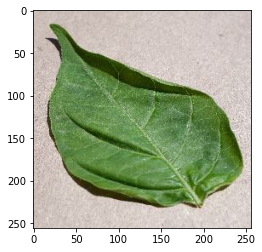

In [201]:
import numpy as np
for images_batch_3, labels_batch_3 in test_ds_3.take(1):
    
    first_image = images_batch_3[0].numpy().astype('uint8')
    first_label = labels_batch_3[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names_3[first_label])
    
    batch_prediction = pepp_model.predict(images_batch_3)
    print("predicted label:",class_names_3[np.argmax(batch_prediction[0])])

In [202]:
def predict_pepp(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names_3[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

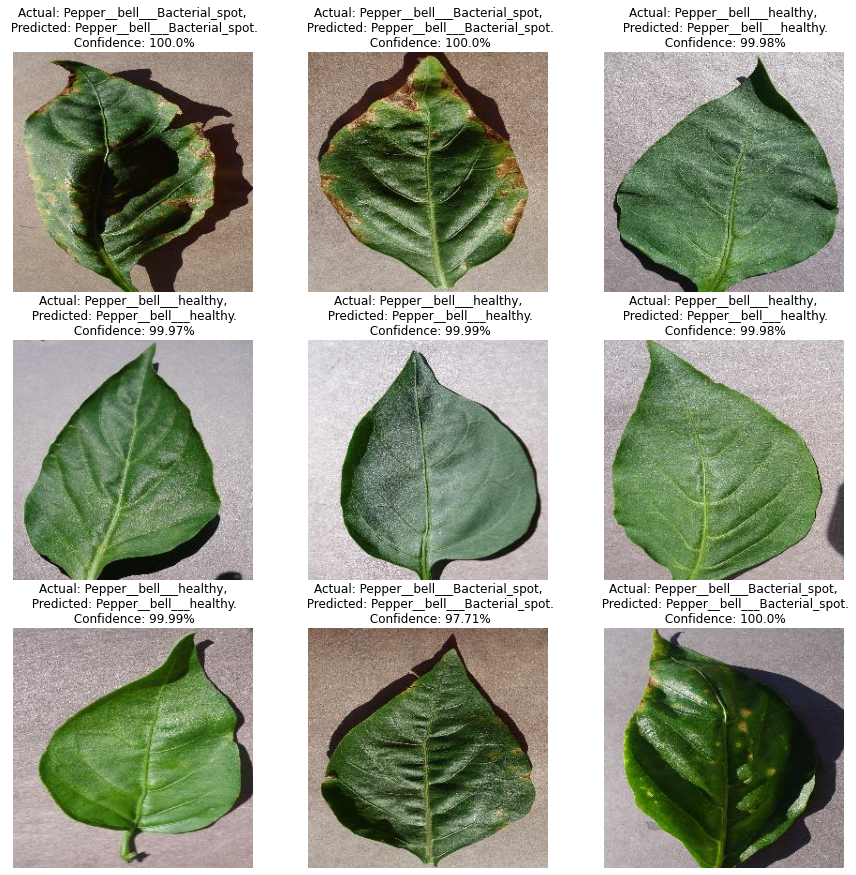

In [205]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds_3.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict_pepp(pepp_model, images[i].numpy())
        actual_class = class_names_3[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

In [206]:
import os
model_version=max([int(i) for i in os.listdir("../pepper_model/") + [0]])+1
pepp_model.save(f"../pepper_model/{model_version}")

INFO:tensorflow:Assets written to: ../pepper_model/1\assets


In [207]:
model.save("../peppers.h5")